# Mask R-CNN - Inspect Solar Trained Model

Code and visualizations to test, debug, and evaluate the Mask R-CNN model. First, we just prepare and run detction on a random image. Then, we analyse in-depth each part of the model (Region Proposal Network, Classification branch, Mask Generation branch, CNN Feature Maps and model weights distributions) and provide visualizuations at each step.

In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline 

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

from samples.solar import solar

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Path to solar trained weights
SOLAR_WEIGHTS_PATH = os.path.join(ROOT_DIR, "logs", "mask_rcnn_solar_0025.h5")

# Path to testing images
SOLAR_DIR = os.path.join(ROOT_DIR, "datasets/solar/images_stockton/")

# Path to testing masks
MASKS_DIR = os.path.join(ROOT_DIR, "datasets/solar/masks_stockton/")

Using TensorFlow backend.


In [2]:
# Check the correct versions of tensorflow (1.15.2) and keras (2.1.0) have been loaded
import tensorflow as tf
import keras
print(tf.__version__)
print(keras.__version__)

# Ignore deprecation warnings
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
from tensorflow.python.util import deprecation
deprecation._PRINT_DEPRECATION_WARNINGS = False

1.15.2
2.1.0


## Prepare and run detection

### Configurations

In [3]:
config = solar.SolarConfig()

In [4]:
# Override the training configurations with a few
# changes for inferencing.

class InferenceConfig(solar.SolarConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE             

In [5]:
# Device to load the neural network on - useful if you're
# training a model on the same machine with GPU
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0
TEST_MODE = "inference"

In [6]:
# Function for nicer figures
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

### Load Test Dataset

In [7]:
dataset = solar.SolarDataset()
dataset.load_solar(SOLAR_DIR)

dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 1204
Classes: ['BG', 'solar array']


### Load Model

In [8]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

In [9]:
# Load weights
print("Loading weights ", SOLAR_WEIGHTS_PATH)
model.load_weights(SOLAR_WEIGHTS_PATH, by_name=True)

Loading weights  /Users/Thomas/Documents/Data Science X/Stage/Total/Solar Panels/Githubs/Mask_RCNN/logs/mask_rcnn_solar_0025.h5








### Run Detection

In [30]:
# Pick random image in testing dataset
image_id = random.choice(dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    solar.load_image_gt(dataset, config, image_id, use_mini_mask=False, masks_dir=MASKS_DIR)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))

image ID: solar.10sfh510120_09_09 (384) /Users/Thomas/Documents/Data Science X/Stage/Total/Solar Panels/Githubs/Mask_RCNN/datasets/solar/images_stockton/10sfh510120_09_09.png


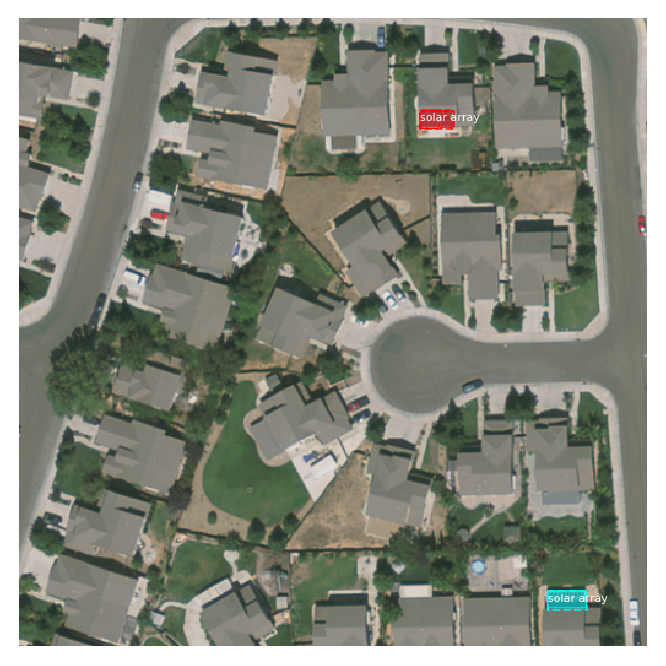

In [31]:
# Visualize ground truth
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset.class_names, figsize=(12, 12))

In [32]:
# Run detection
yhat = model.detect([original_image], verbose=1)[0] # verbose=0
n_solar = yhat['masks'].shape[2]
print("Nb of solar arrays detected: ", n_solar)

Processing 1 images
image                    shape: (512, 512, 3)         min:   26.00000  max:  248.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -97.70000  max:  129.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
Nb of solar arrays detected:  2


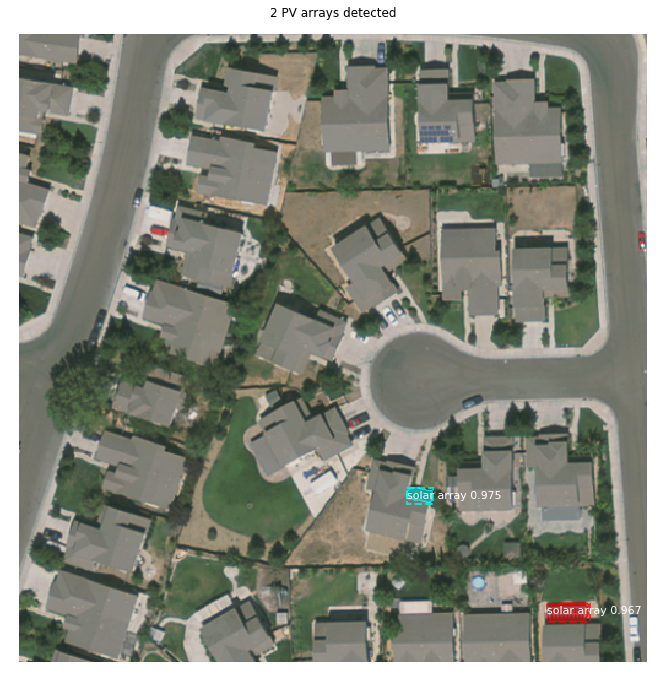

In [34]:
# Display
visualize.display_instances(original_image, yhat['rois'], yhat['masks'],
                            yhat['class_ids'], dataset.class_names,
                            yhat['scores'], figsize=(12, 12),
                            title="{} PV arrays detected".format(n_solar))

In [40]:
# Compute surface over detected masks
pv_surface = solar.compute_mask_to_surface(yhat['masks'])

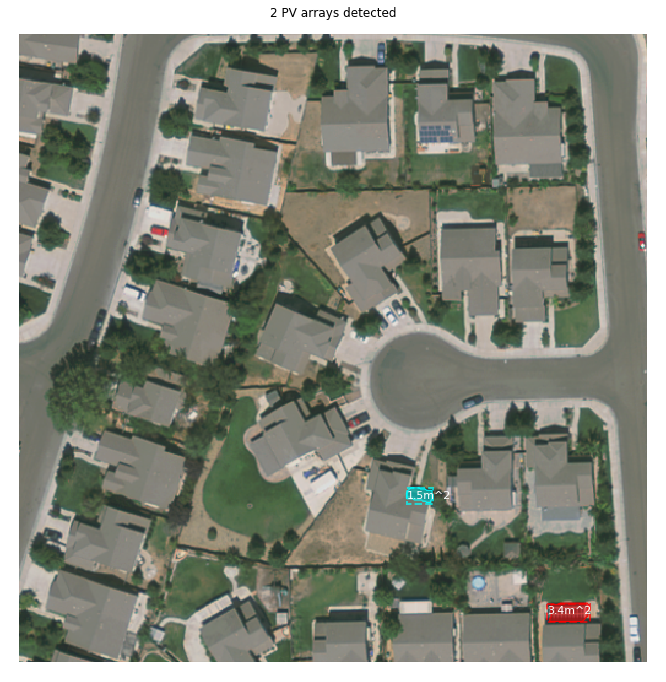

In [42]:
# Display prediction, with surface annotation
pv_size_annot = [str(round(x,1))+"m^2" for x in pv_surface]
visualize.display_instances(original_image, yhat['rois'], yhat['masks'],
                            yhat['class_ids'], dataset.class_names,
                            captions=pv_size_annot, 
                            title="{} PV arrays detected".format(n_solar),
                            figsize=(12, 12))

### Color Splash

This is just for fun, adapted from the `balloon.py` example in Matterport's Mask R-CNN github.

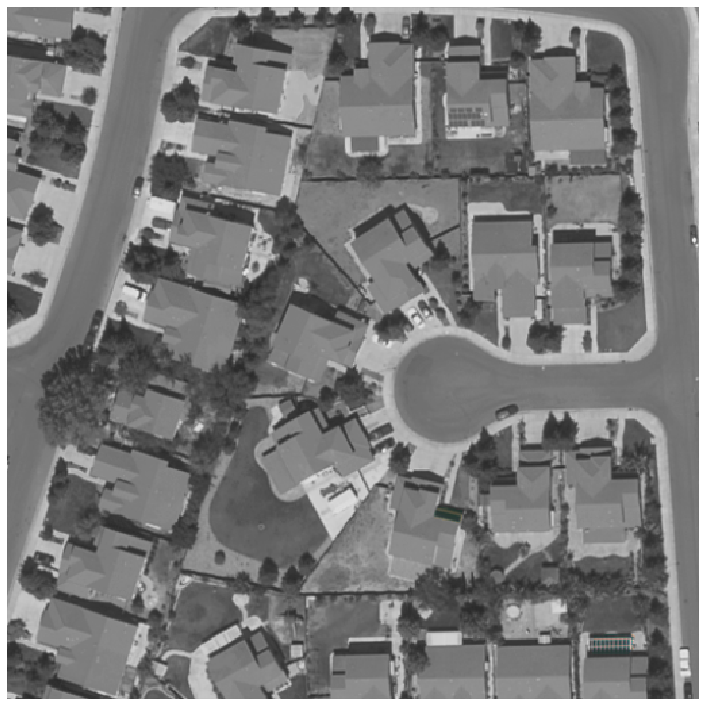

In [38]:
splash = solar.color_splash(original_image, r['masks'])
display_images([splash], cols=1)

## Step by Step Prediction Analysis

### Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

#### 1.a. RPN Targets

The RPN targets are the training labels for the RPN.

To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU (Intersection over Union) of the anchors compared with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in-between (i.e. that cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [43]:
# Generate RPN training targets

# The target_rpn_match value corresponds to 1 for positive anchors,
# -1 for negative anchors and 0 for neutral anchors.

target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    original_image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

target_rpn_match         shape: (65472,)              min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (128, 4)              min:   -1.54680  max:    2.20971  float64
positive_anchors         shape: (2, 4)                min:   74.34315  max:  477.65685  float64
negative_anchors         shape: (126, 4)              min:   -8.00000  max:  509.65685  float64
neutral anchors          shape: (65344, 4)            min:  -90.50967  max:  538.50967  float64
refined_anchors          shape: (2, 4)                min:   75.00000  max:  482.00003  float32


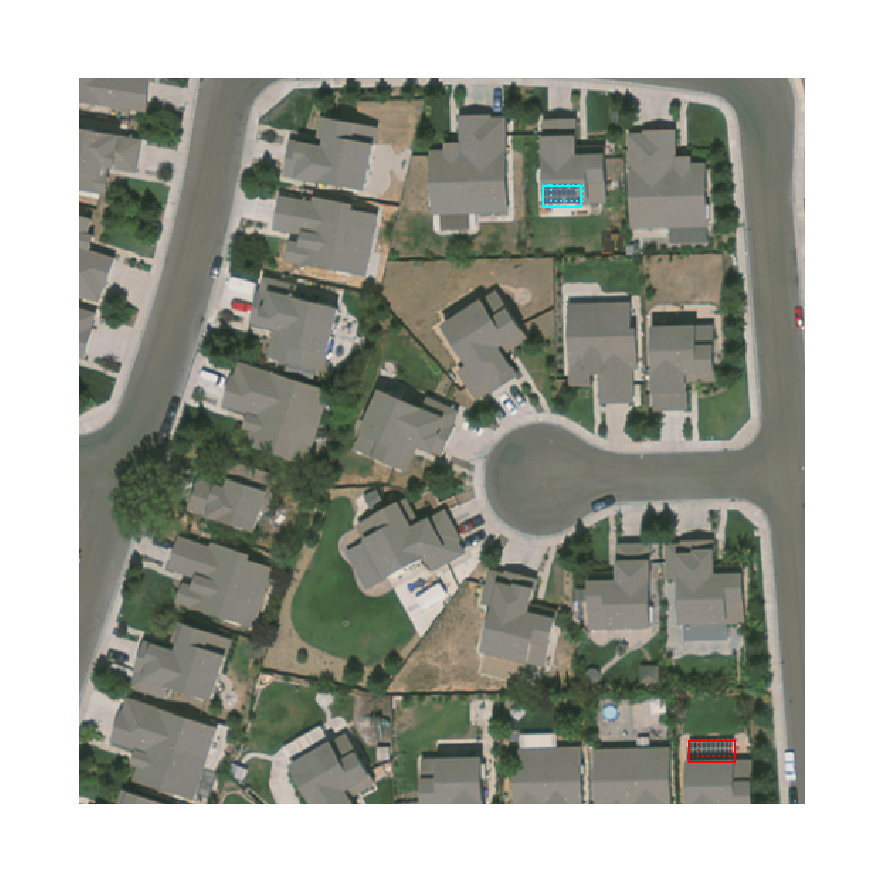

In [44]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(original_image, boxes=positive_anchors,
                     refined_boxes=refined_anchors, ax=get_ax())

#### 1.b. RPN Predictions

Here we run the RPN graph and display its predictions (i.e. the regions/anchors/boxes with the highest probability of containing a solar array).

In [45]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([original_image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 65472, 2)         min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.17712  max:    1.05188  float32
refined_anchors          shape: (1, 6000, 4)          min:   -0.36476  max:    1.36583  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (1000,)               min:    0.00000  max: 1003.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


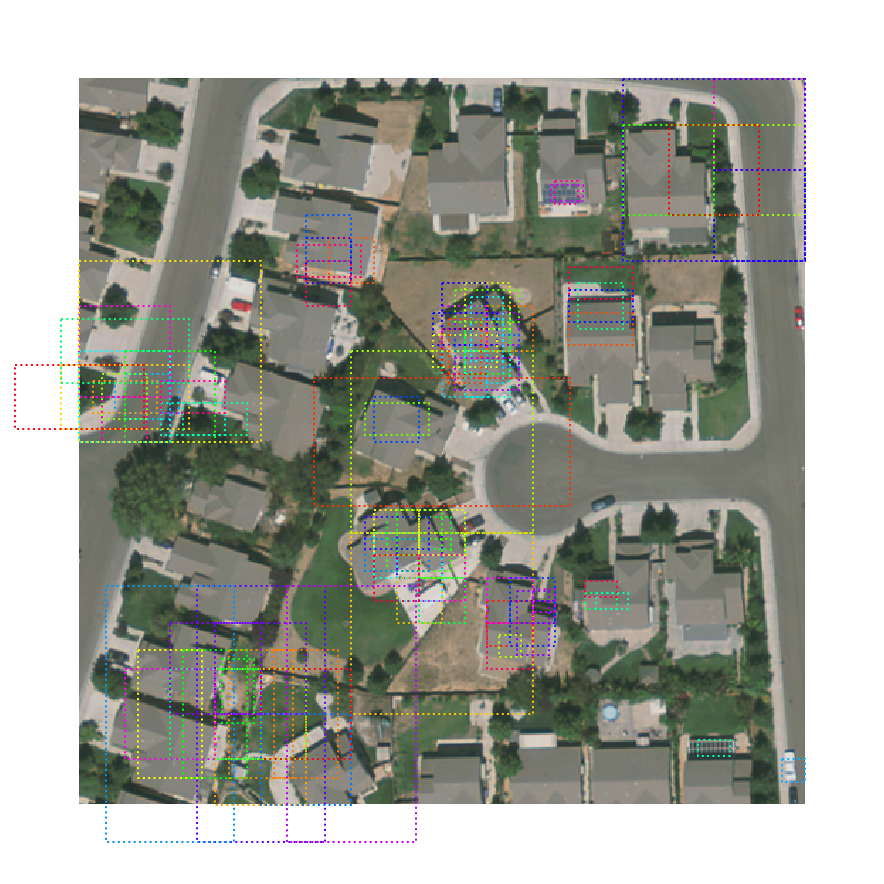

In [46]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(original_image,
                     boxes=model.anchors[sorted_anchor_ids[:limit]],
                     ax=get_ax())

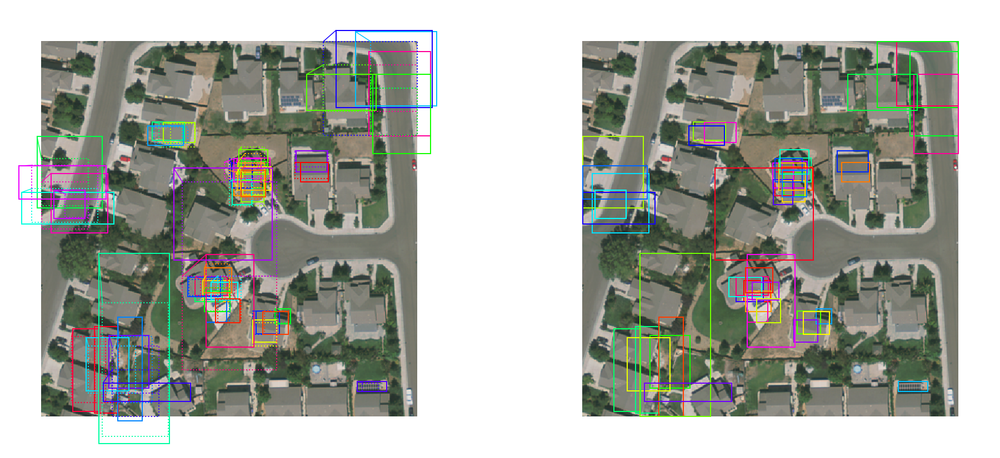

In [47]:
# Show top anchors with refinement, and then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], original_image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], original_image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], original_image.shape[:2])
visualize.draw_boxes(original_image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(original_image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

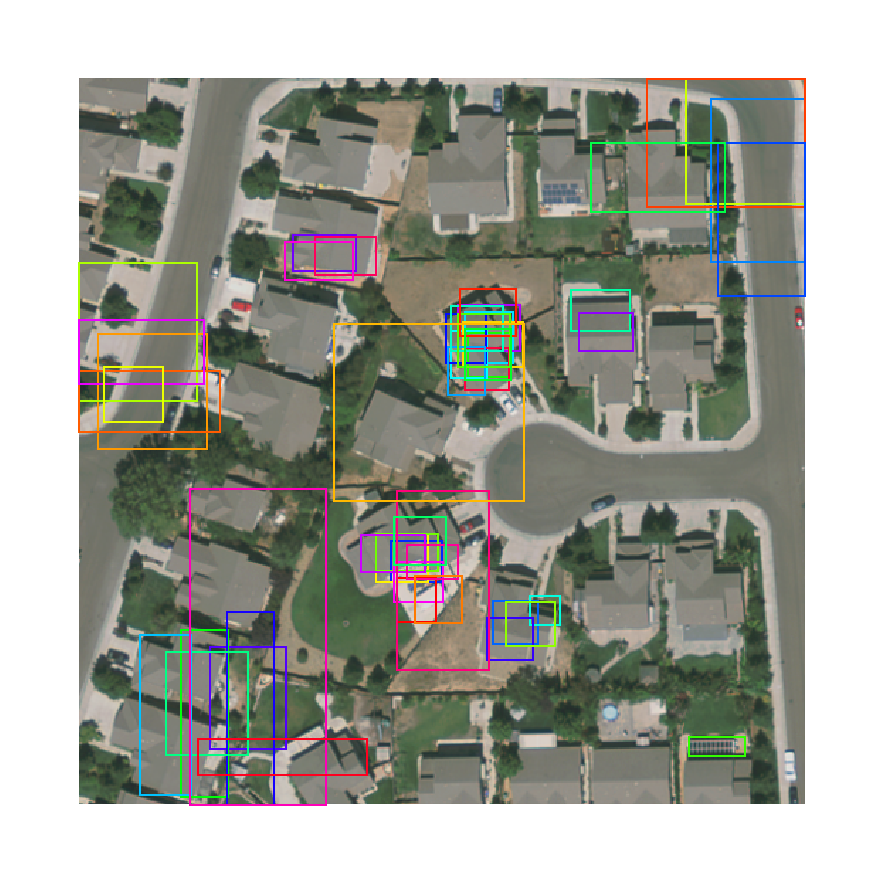

In [48]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(original_image, 
                     refined_boxes=refined_anchors_clipped[ixs], 
                     ax=get_ax())

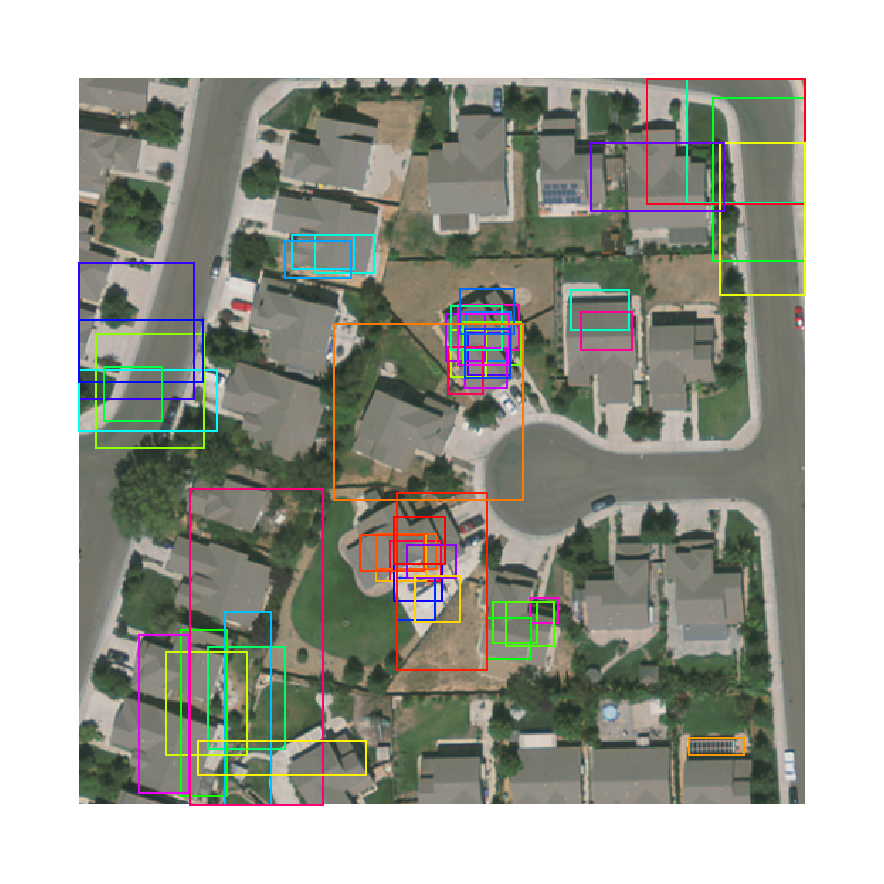

In [49]:
# Show final proposals (same as in previous step, i.e. refined anchors 
# after NMS, but with coordinates normalized to [0, 1] range).
limit = 50
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(original_image, refined_boxes=proposals, ax=get_ax())

### Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them (i.e. the classifier head generates class probabilities for each proposal). We show the output of this step in the 2 cells below, and then we deep-dive into how the classification is run in details.

In [50]:
# Get input and output for the classifier and mask heads
mrcnn = model.run_graph([original_image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 2)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 2, 4)       min:   -3.78273  max:    4.28659  float32
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00006  max:    1.00000  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32


2 detections: ['solar array' 'solar array']


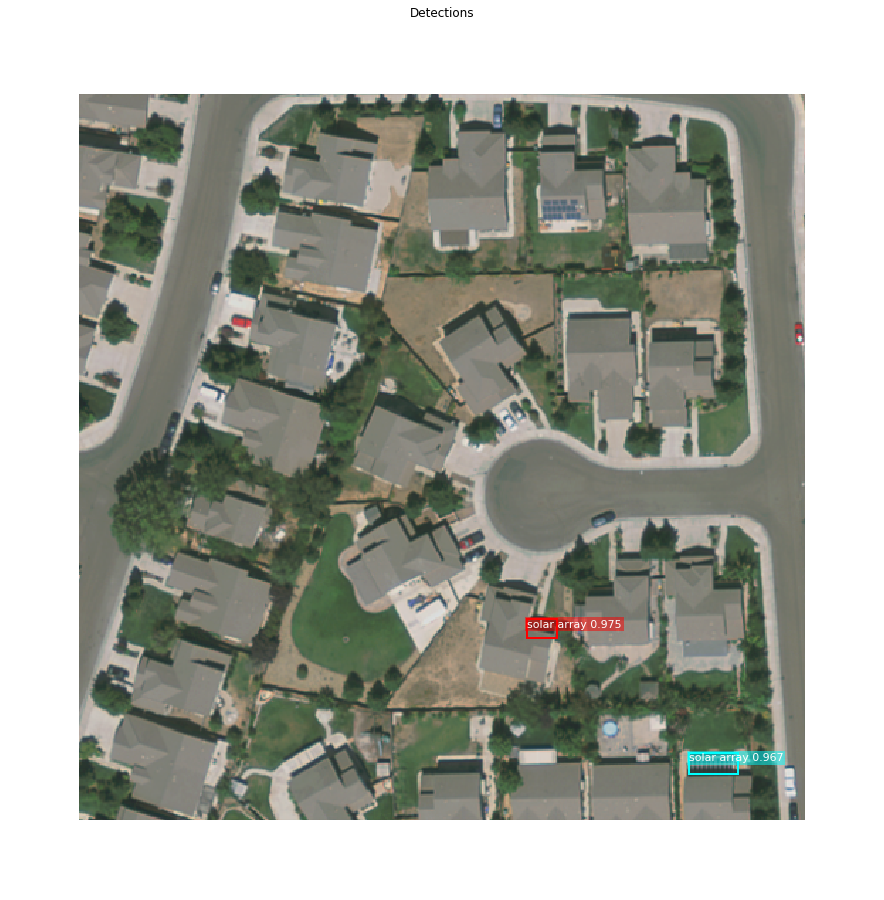

In [51]:
# Get detection class IDs and trim zero padding
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]

visualize.draw_boxes(
    original_image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], original_image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

#### 2.a. Positive vs. negative ROIs

First let's visualize how many region proposals are "positive" in our random test image, i.e. how many ROIs are classified as containing the object(s) we want to detect with a confidence score over a defined threshold.

In [57]:
# Region proposals are in normalized coordinates.
# We start by scaling them to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs. empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

1000 Valid proposals out of 1000
13 Positive ROIs
[('BG', 987), ('solar array', 13)]


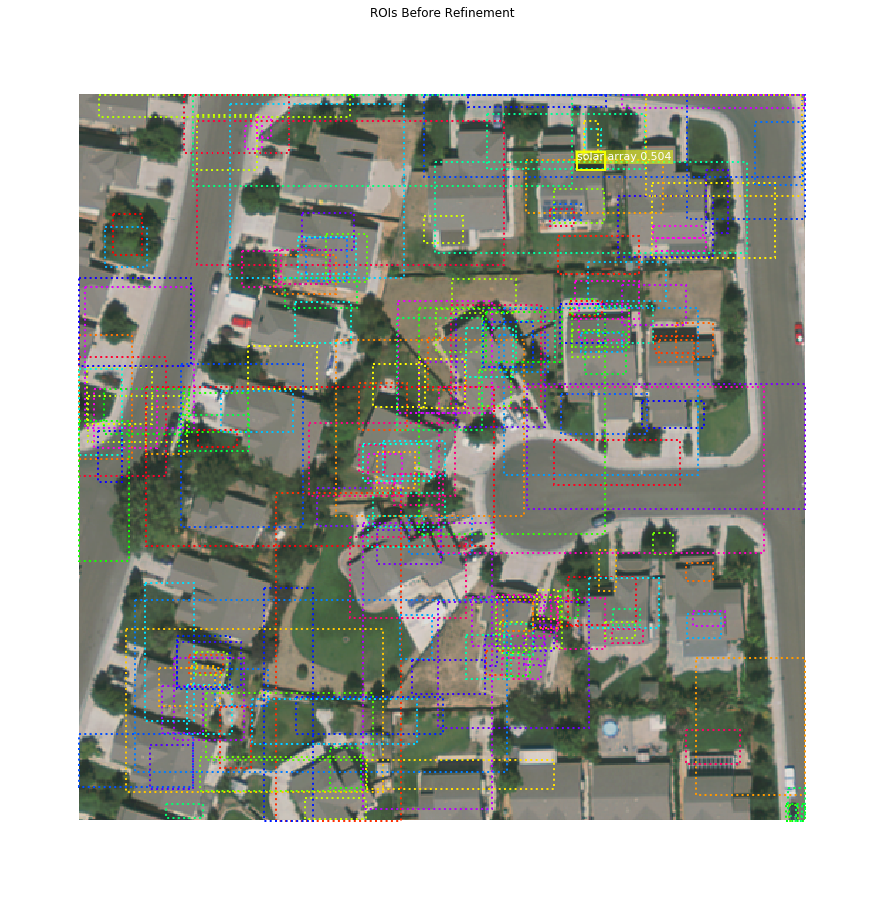

In [58]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(original_image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

#### 2.b. Apply Bounding Box Refinement

Positive bounding boxes are refined, i.e. shifted to increase their confidence score. We display a sample of them for review.

roi_bbox_specific        shape: (1000, 4)             min:   -3.33959  max:    3.83222  float32
refined_proposals        shape: (1000, 4)             min:  -30.00000  max:  574.00000  int32


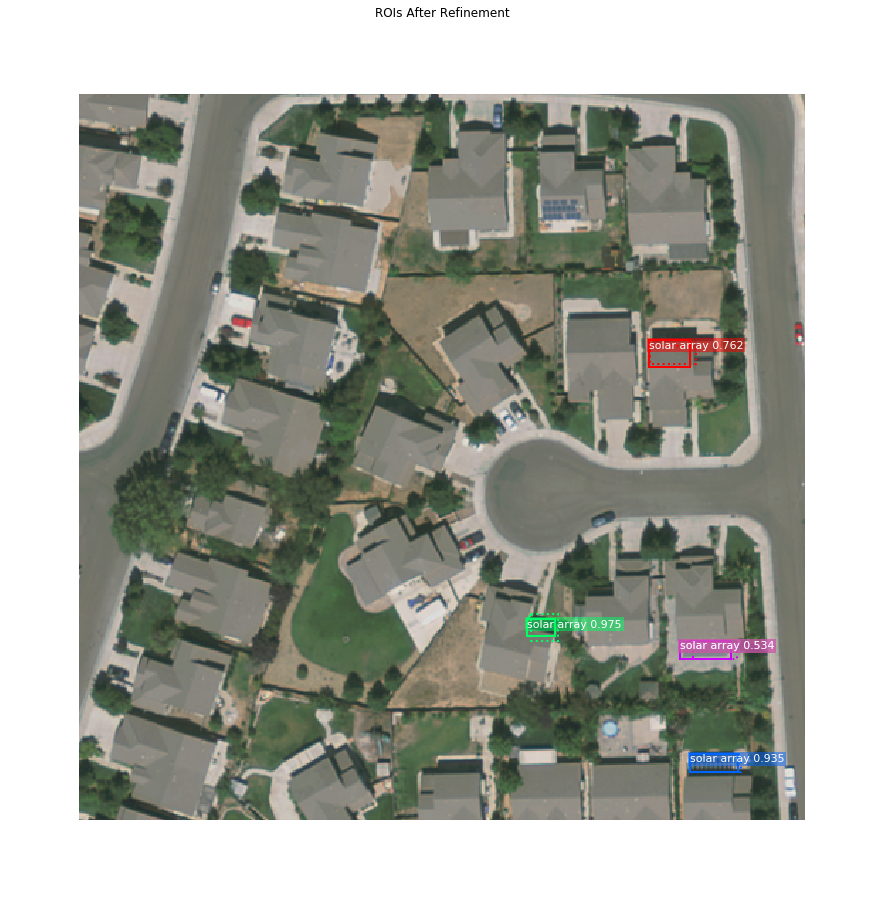

In [59]:
# Load class-specific bounding box shifts
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(original_image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

#### 2.c. - Filter Low Confidence Detections

ROIs with still a too low confidence score are eliminated at this step (threshold can be tuned).

In [60]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 13 detections:
[  7  23 137 142 147 207 213 257 299 410 412 526 871]


In [61]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.9 confidence. Keep 4:
[ 23 142 147 526]


#### 2.d. - Per-Class Non-Max Suppression

Finally, Non-Max Suppression is used to select even fewer positive ROIs. NMS computes the IoU score of each box compared to the others, and keeps only the ones with IoU over a defined threshold. This makes sure you keep only the most relevant proposals (more details available [here](https://towardsdatascience.com/non-maximum-suppression-nms-93ce178e177c)).

After this step, we obtain the final detection bounding boxes, for each class, with their confidence score.

In [62]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indices
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

solar array           : [ 23 142 147 526] -> [ 23 142]

Kept after per-class NMS: 2
[ 23 142]


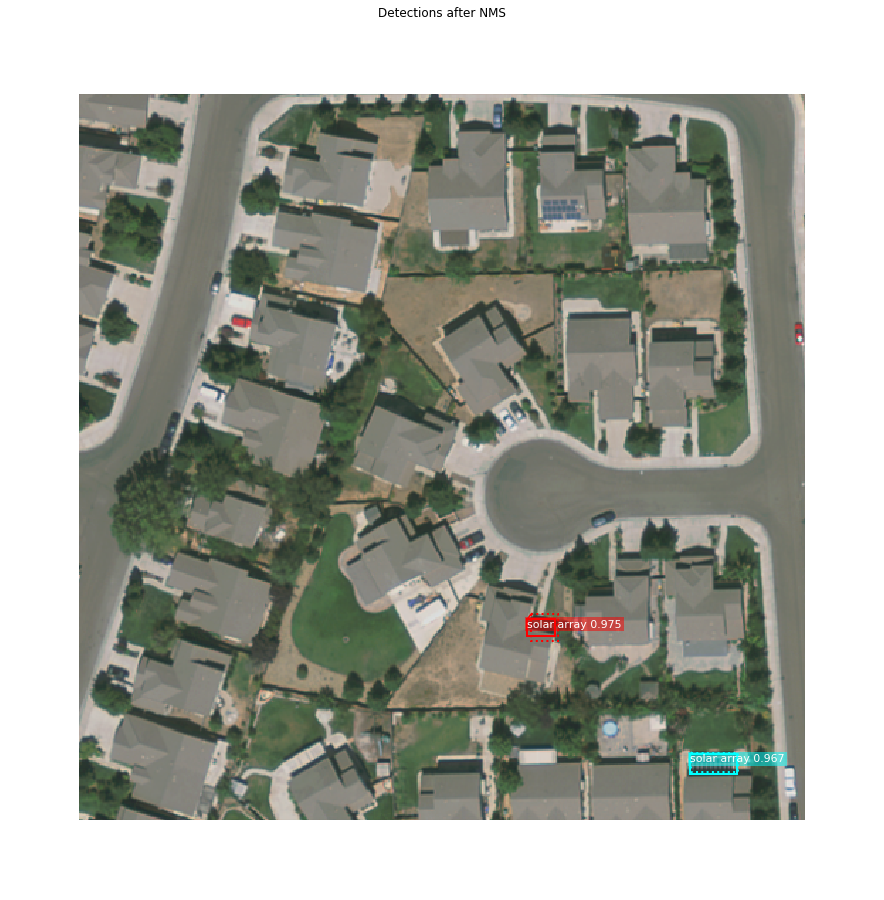

In [63]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    original_image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

### Stage 3: Generating Masks

The Masks head of the model generates segmentation masks for every instance detected in the test images.

Remark: in the Mask R-CNN architecture the Masks head is run over proposals from the RPN _in parallel_ to the Classification head, which leads to faster and more accurate results.

#### 3.a. Mask Targets

Let's just visualize the targets (ground truth masks) of the mask branch for our test image, before we run and plot predictions.

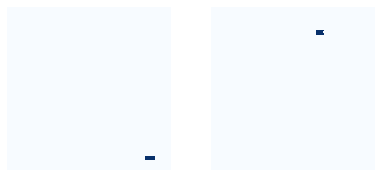

In [64]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

#### 3.b. Mask Predictions

In [65]:
# Get predictions of mask head
mrcnn = model.run_graph([original_image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00006  max:    1.00000  float32
2 detections: ['solar array' 'solar array']


In [66]:
# Extracted predicted masks for plotting
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (2, 28, 28)           min:    0.00006  max:    1.00000  float32
det_masks                shape: (2, 512, 512)         min:    0.00000  max:    1.00000  bool


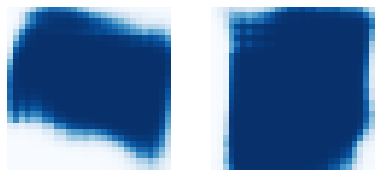

In [67]:
# Plot predicted masks
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

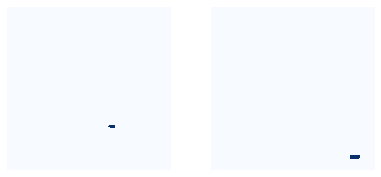

In [68]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

We have been able to predict binary masks for solar panel instances in our test image.

For better results, we would need to re-train the model with either:
* New data (i.e. more data, augmented data, different preprocessing methods)
* Tuned hyperparameters (especially anchors, that we visualize in the `inspect_solar_data.ipynb` notebook and in the RPN part of this notebook, and the various detection thresholds that we visualized in the Classification part of this notebook).

## Visualize CNN Activation layers

In some cases it helps to look at the output feature maps from different layers and visualize them to catch issues and odd patterns.

In [52]:
# Get activations of a few sample layers
activations = model.run_graph([original_image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet101
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 512, 512, 3)      min:  -97.70000  max:  129.10001  float32
res2c_out                shape: (1, 128, 128, 256)    min:    0.00000  max:   26.66625  float32
res3c_out                shape: (1, 64, 64, 512)      min:    0.00000  max:   33.45153  float32
res4w_out                shape: (1, 32, 32, 1024)     min:    0.00000  max:   58.31328  float32
rpn_bbox                 shape: (1, 65472, 4)         min:  -15.13672  max:   38.06765  float32
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


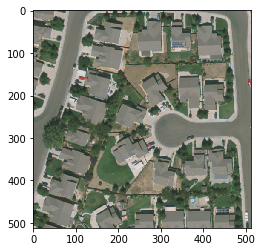

In [53]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0], config))

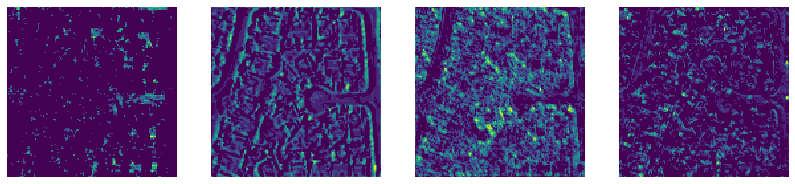

In [54]:
# Plot some of the backbone feature maps
display_images(np.transpose(activations["res2c_out"][0,:,:,:4], [2, 0, 1]), cols=4)

## Inspect Model Weights

TODO: clean-up this part and derive conclusions.

### Review weight stats

In [55]:
# Show stats of all trainable weights    
visualize.display_weight_stats(model)

WEIGHT NAME,SHAPE,MIN,MAX,STD
conv1/kernel:0,"(7, 7, 3, 64)",-0.8616,+0.8451,+0.1315
conv1/bias:0,"(64,)",-0.0002,+0.0004,+0.0001
bn_conv1/gamma:0,"(64,)",+0.0835,+2.6411,+0.5091
bn_conv1/beta:0,"(64,)",-2.3931,+5.3610,+1.9781
bn_conv1/moving_mean:0,"(64,)",-173.0470,+116.3013,+44.5654
bn_conv1/moving_variance:0*** Overflow?,"(64,)",+0.0000,+146335.3594,+21847.9668
res2a_branch2a/kernel:0,"(1, 1, 64, 64)",-0.6574,+0.3179,+0.0764
res2a_branch2a/bias:0,"(64,)",-0.0022,+0.0082,+0.0018
bn2a_branch2a/gamma:0,"(64,)",+0.2169,+1.8489,+0.4116
bn2a_branch2a/beta:0,"(64,)",-2.1180,+3.7332,+1.1786


### Histograms of weights

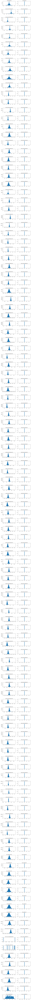

In [56]:
# Pick layer types to display
LAYER_TYPES = ['Conv2D', 'Dense', 'Conv2DTranspose']

# Get layers
layers = model.get_trainable_layers()
layers = list(filter(lambda l: l.__class__.__name__ in LAYER_TYPES, 
                layers))

# Display histograms
fig, ax = plt.subplots(len(layers), 2, figsize=(10, 3*len(layers)),
                       gridspec_kw={"hspace":1})
for l, layer in enumerate(layers):
    weights = layer.get_weights()
    for w, weight in enumerate(weights):
        tensor = layer.weights[w]
        ax[l, w].set_title(tensor.name)
        _ = ax[l, w].hist(weight[w].flatten(), 50)

## Model Evaluation

### Mean Average Precision (mAP)

There are several possible methods to evaluate the accuracy performance of an object detection model. Here, we are performing _instance segmentation_ and for this specific object detection task the most commonly used scoring method is the **Mean Average Precision** (mAP).

To compute this metric, we first consider as "positive detections" the predicted masks whose **IoU score** is over a certain threshold, for example 0.5 (i.e. the intersection over union compared to the ground truth mask is over 50%). We then compute the Precision and Recall (if we have several classes to predict, we compute a mean over all classes) and a smoothed Precision vs. Recall curve. The final mAP score is the **area under the Mean Precision-Recall curve**.

Reminders: $Precision = \frac{True Positives}{True Positives + False Positives}$ and $Recall = \frac{True Positives}{True Positives + False Negatives}$.

More details can be found [here](https://www.jeremyjordan.me/evaluating-image-segmentation-models/) and [here](https://towardsdatascience.com/breaking-down-mean-average-precision-map-ae462f623a52).

We can obtain different indicators when selecting different IoU thresholds for True Positives (for example, the COCO challenge uses diffrent IoU scores from 0.5 to 0.95 to define True Positives). Let's try several thresholds.

* **IoU = 0.5**

The function `compute_ap` from the `utils.py` helper file computes average precision over a sample of predicted masks. Its IoU threshold can be specified with the `iou_threshold` argument. Default (used here) is 0.5.

In [10]:
# Compute VOC-Style mAP @ IoU=0.5
# Running on 100 samples from test dataset. Increase for better evaluation.

image_ids = np.random.choice(dataset.image_ids, 100)
APs = []

for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        solar.load_image_gt(dataset, config, image_id, 
                               use_mini_mask=False, masks_dir=MASKS_DIR)
    molded_images = np.expand_dims(modellib.mold_image(image, config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute mean AP over recall range
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

mAP:  0.15791666716337205


For now, this score is low. We could probably target a level >0.8, with the help of model tuning (more data, tuned anchors and detection thresholds).

* **IoU = 0.50: 0.05: 0.95 (average for IoU from 0.5 to 0.95, with 0.05 step)**

The function `compute_ap_range` from the `utils.py` helper file computes AP scores in a similar fashion as the function above, but averages them over different IoU thresholds. The thresholds range can be specified with the `iou_threshold` argument - default (used here) is the range from 0.5 to 0.95, with 0.05 increments. This is the primary metric for the COCO challenge, and the most relevant one for our project.

In [12]:
# Compute VOC-Style mAP @ IoU = 0.50: 0.05: 0.95
# Running on 100 samples from test dataset. Increase for better evaluation.

image_ids = np.random.choice(dataset.image_ids, 10)
APs = []

for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        solar.load_image_gt(dataset, config, image_id, 
                            use_mini_mask=False, masks_dir=MASKS_DIR)
    molded_images = np.expand_dims(modellib.mold_image(image, config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute mean AP over recall range
    AP = utils.compute_ap_range(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

AP @0.50:	 0.125
AP @0.55:	 0.000
AP @0.60:	 0.000
AP @0.65:	 0.000
AP @0.70:	 0.000
AP @0.75:	 0.000
AP @0.80:	 0.000
AP @0.85:	 0.000
AP @0.90:	 0.000
AP @0.95:	 0.000
AP @0.50-0.95:	 0.013
AP @0.50:	 0.000
AP @0.55:	 0.000
AP @0.60:	 0.000
AP @0.65:	 0.000
AP @0.70:	 0.000
AP @0.75:	 0.000
AP @0.80:	 0.000
AP @0.85:	 0.000
AP @0.90:	 0.000
AP @0.95:	 0.000
AP @0.50-0.95:	 0.000
AP @0.50:	 1.000
AP @0.55:	 1.000
AP @0.60:	 1.000
AP @0.65:	 1.000
AP @0.70:	 1.000
AP @0.75:	 1.000
AP @0.80:	 1.000
AP @0.85:	 1.000
AP @0.90:	 0.000
AP @0.95:	 0.000
AP @0.50-0.95:	 0.800
AP @0.50:	 0.000
AP @0.55:	 0.000
AP @0.60:	 0.000
AP @0.65:	 0.000
AP @0.70:	 0.000
AP @0.75:	 0.000
AP @0.80:	 0.000
AP @0.85:	 0.000
AP @0.90:	 0.000
AP @0.95:	 0.000
AP @0.50-0.95:	 0.000
AP @0.50:	 0.000
AP @0.55:	 0.000
AP @0.60:	 0.000
AP @0.65:	 0.000
AP @0.70:	 0.000
AP @0.75:	 0.000
AP @0.80:	 0.000
AP @0.85:	 0.000
AP @0.90:	 0.000
AP @0.95:	 0.000
AP @0.50-0.95:	 0.000
AP @0.50:	 0.000
AP @0.55:	 0.000
AP @0.

The output of this metric is interesting: we see that for most of the test images, the network doesn't detect any solar panel, which results in a IoU and AP score of 0.

To detect more panels in the images, we need to adjust the anchors and detection thresholds during training.